# Dataset Preperation

In [1]:
import pandas as pd
import numpy as np

path_1="datasets/UNH.csv"
path_2="datasets/PFE.csv"
path_3="datasets/MRK.csv"

asset_1 = pd.read_csv(path_1)
asset_2 = pd.read_csv(path_2)
asset_3 = pd.read_csv(path_3)

asset_1["Date"] = pd.to_datetime(asset_1["Date"]).dt.strftime("%Y-%m-%d")
asset_2["Date"] = pd.to_datetime(asset_2["Date"]).dt.strftime("%Y-%m-%d")
asset_3["Date"] = pd.to_datetime(asset_3["Date"]).dt.strftime("%Y-%m-%d")

asset_labels=["UNH","PFE","MRK"]

start_date="2023-08-23"
start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date].index[0]

# Slice the historical data from start_date onwards
historical_prices_1 = asset_1["Close"].iloc[start_index:].values
historical_prices_2 = asset_2["Close"].iloc[start_index:].values
historical_prices_3 = asset_3["Close"].iloc[start_index:].values
historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
S0 = historical_prices[0, :]
barrier = S0 * 0.59
print(f"Price at initial fixing date: {S0}")
print(f"Barrier Price: {barrier}")

Price at initial fixing date: [480.22924805  34.61804962 107.69082642]
Barrier Price: [283.33525635  20.42464928  63.53758759]


         Date  Percentage
0  2024-08-01       98.29
1  2024-08-02       98.06
2  2024-08-05       97.10
3  2024-08-06       96.76
4  2024-08-07       97.00


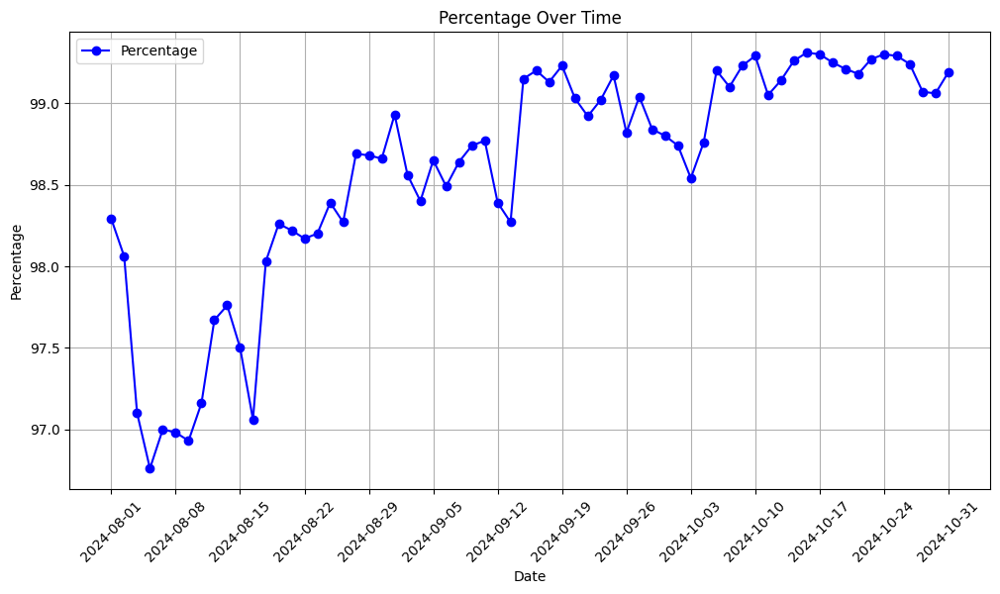

In [2]:
# Load the CSV into a DataFrame
df = pd.read_csv("./datasets/historical_note_price.csv")
df["Date"] = pd.to_datetime(df["Date"]).dt.strftime("%Y-%m-%d")
# Display the first few rows
print(df.head())
import matplotlib.pyplot as plt
# Plot the data
plt.figure(figsize=(12, 6))
plt.plot(df["Date"], df["Percentage"], marker='o', linestyle='-', color='b', label="Percentage")

# Set labels and title
plt.xlabel("Date")
plt.ylabel("Percentage")
plt.title("Percentage Over Time")
plt.xticks(df["Date"][::5], rotation=45)
plt.grid()
plt.legend()

# Show the plot
plt.show()

# Model

### Multi-Asset Black-Scholes Model

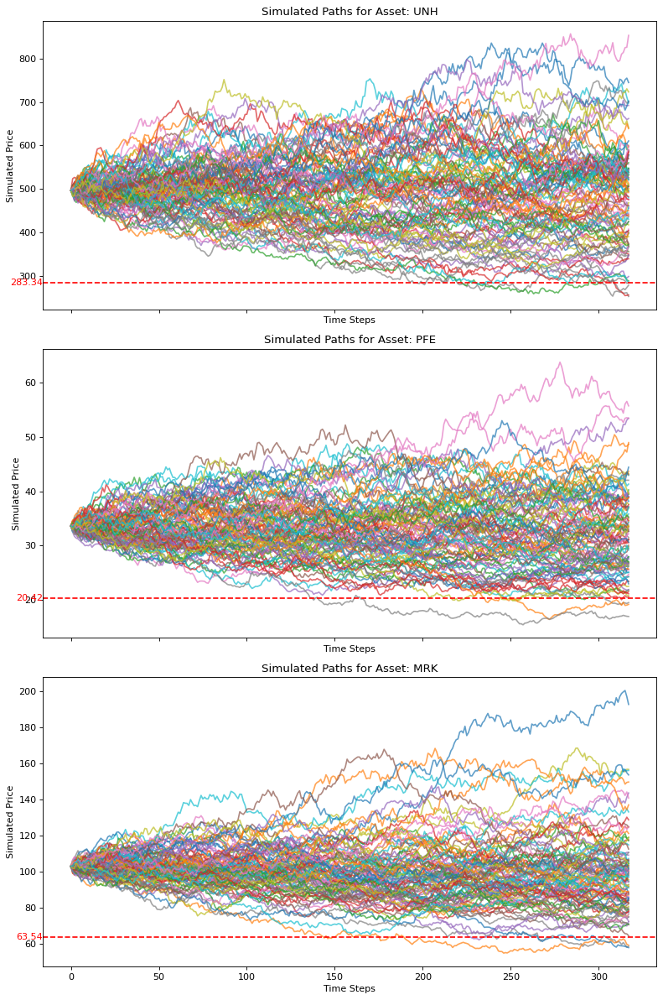

In [3]:
from GBM import MultiBS

multi_bs = MultiBS()
M=10_000
forward_simulation = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M)
v, sigma = multi_bs.calibrate_model(forward_simulation)
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=100)
multi_bs.plot(simul)

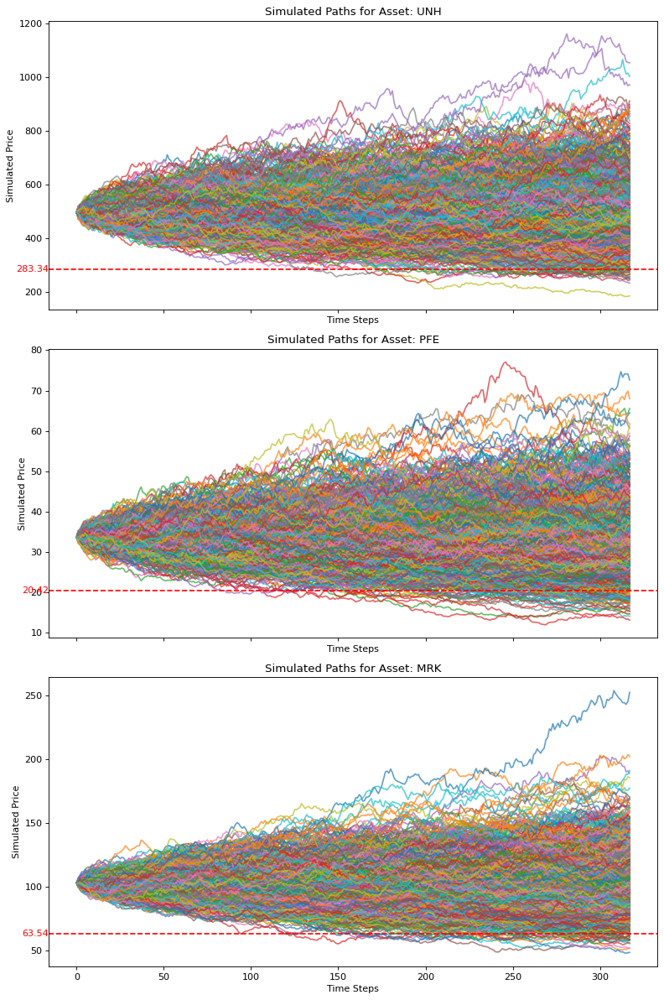

Variance of the final price for asset 1: 16419.51034209058
Variance of the final price for asset 2: 77.92472824120887
Variance of the final price for asset 3: 568.231099764877


array([[2.21635190e-04, 6.87246536e-05, 5.07740442e-05],
       [6.87246536e-05, 2.32895565e-04, 6.38491781e-05],
       [5.07740442e-05, 6.38491781e-05, 1.58879290e-04]])

In [4]:
simul = multi_bs.simulate_multi_GBM_exact(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

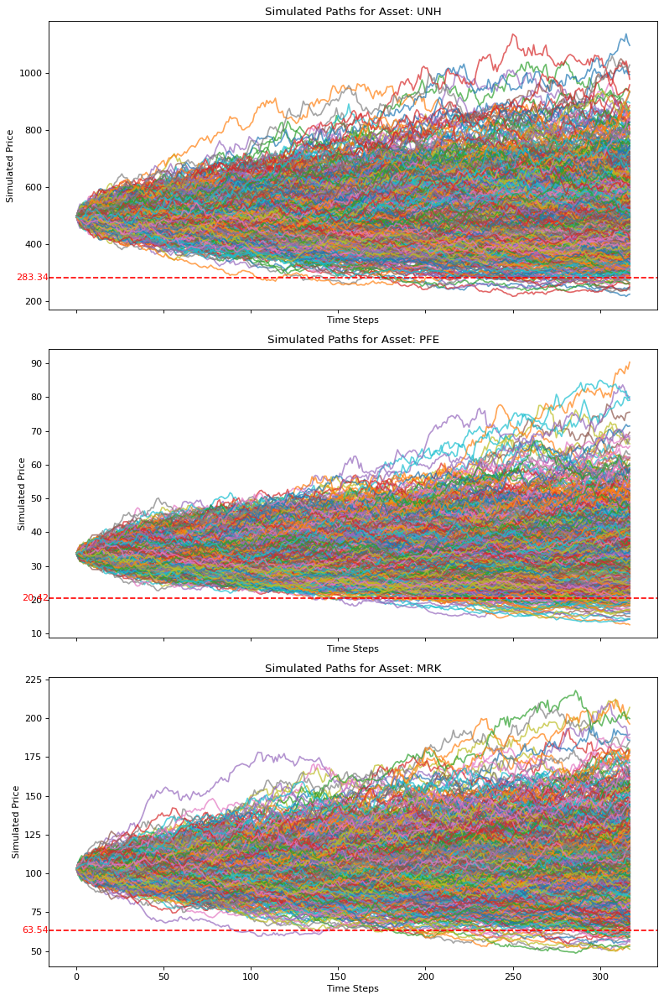

Variance of the final price for asset 1: 2219.9787872928205
Variance of the final price for asset 2: 18.747607386788456
Variance of the final price for asset 3: 62.55392124711514


array([[2.20644299e-04, 6.85546781e-05, 4.94949446e-05],
       [6.85546781e-05, 2.34620624e-04, 6.36132916e-05],
       [4.94949446e-05, 6.36132916e-05, 1.59321565e-04]])

In [5]:
simul = multi_bs.simulate_multi_GBM_antithetic(m=317, M=1000)
multi_bs.plot(simul)
x = simul[:,:,:500] + simul[:,:,500:] 
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(x[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

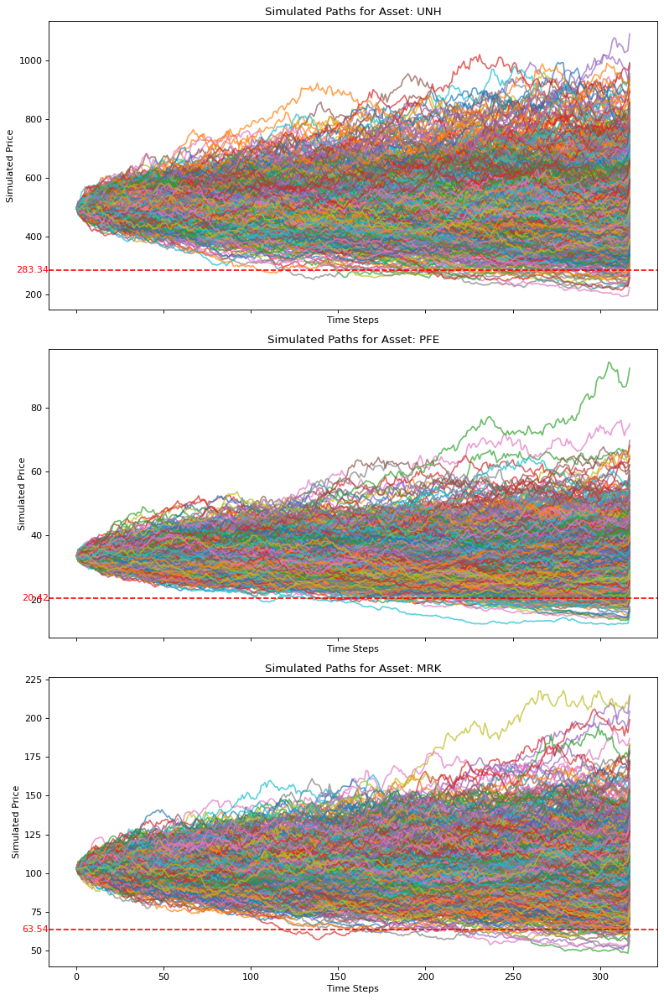

Variance of the final price for asset 1: 18231.429557638934
Variance of the final price for asset 2: 84.07616343679678
Variance of the final price for asset 3: 543.7512780014058


array([[2.37604823e-04, 8.44022466e-05, 6.51125600e-05],
       [8.44022466e-05, 2.52027323e-04, 7.98403285e-05],
       [6.51125600e-05, 7.98403285e-05, 1.74408643e-04]])

In [6]:
simul = multi_bs.simulate_multi_GBM_control_variate(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

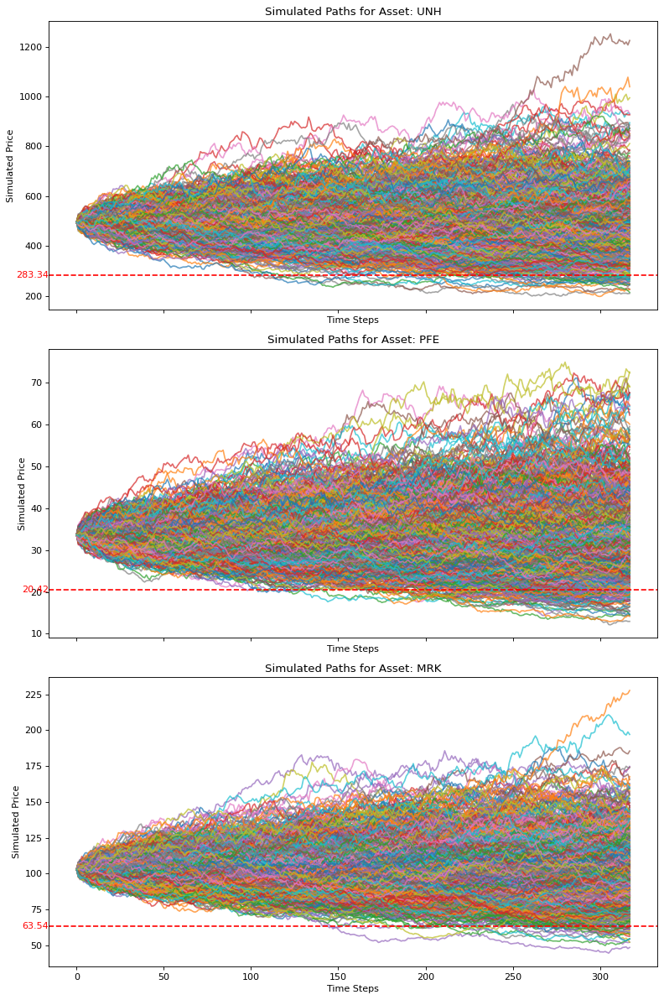

Variance of the final price for asset 1: 17032.588441235806
Variance of the final price for asset 2: 95.65389407710259
Variance of the final price for asset 3: 534.7597908566942


array([[2.23035408e-04, 6.90906329e-05, 5.11370335e-05],
       [6.90906329e-05, 2.35624270e-04, 6.43105402e-05],
       [5.11370335e-05, 6.43105402e-05, 1.60145159e-04]])

In [7]:
simul = multi_bs.simulate_multi_GBM_stratified(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")
log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

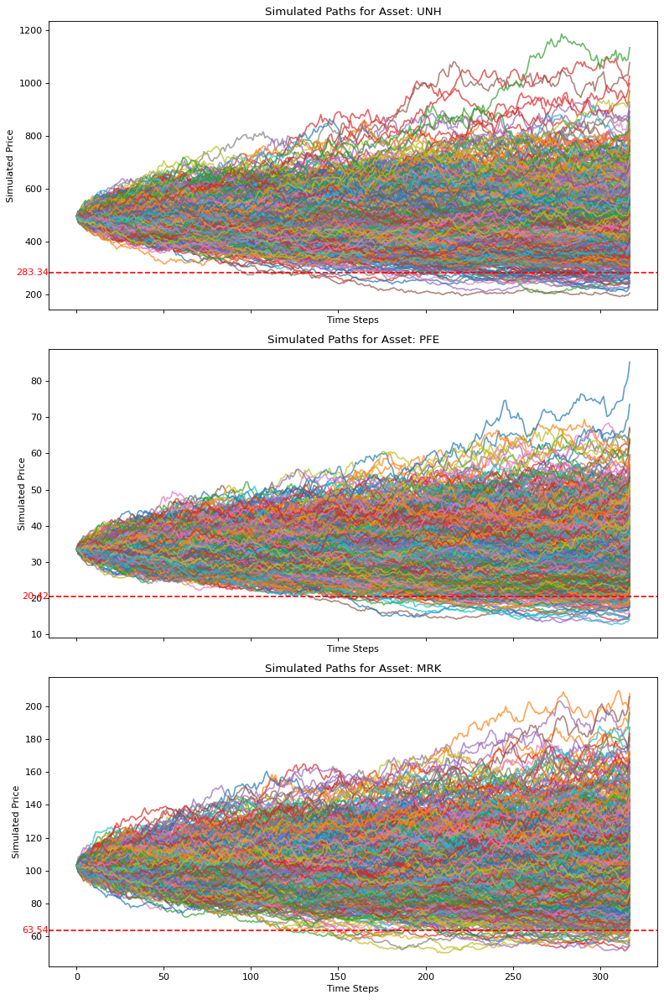

Variance of the final price for asset 1: 17620.416019312095
Variance of the final price for asset 2: 91.26426256754925
Variance of the final price for asset 3: 618.0558494282083


array([[2.29666244e-04, 7.79337150e-05, 5.65314093e-05],
       [7.79337150e-05, 2.43073210e-04, 6.99274486e-05],
       [5.65314093e-05, 6.99274486e-05, 1.63848121e-04]])

In [8]:
simul = multi_bs.simulate_multi_GBM_importance_sampling(m=317, M=1000)
multi_bs.plot(simul)
for i in range(3):
    print(f"Variance of the final price for asset {i+1}: {np.var(simul[:, -1,:][i])}")

log_returns = np.log(simul[:, 1:, :] / simul[:, :-1, :])  # Shape: (num_assets, num_steps-1, num_paths)

# Reshape the log returns to 2D: (num_assets, (num_steps-1) * num_paths)
log_returns_reshaped = log_returns.reshape(3, -1).T

# Calculate the covariance matrix
cov_matrix = np.cov(log_returns_reshaped, rowvar=False)
cov_matrix

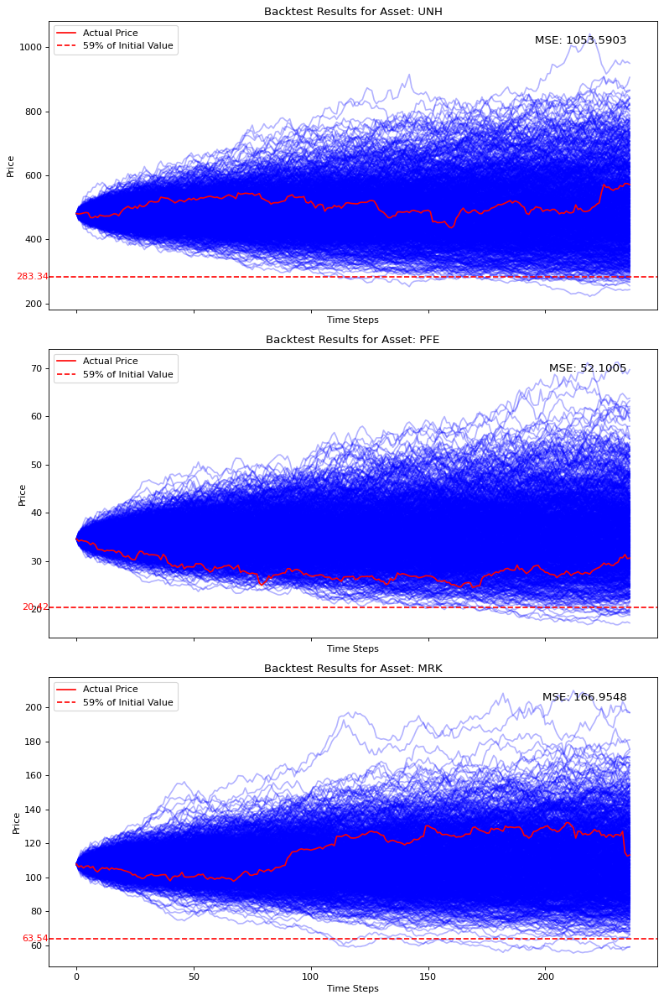

Mean Squared Error (MSE) for each asset: [1053.59026395   52.10047244  166.95481313]
Root Mean Squared Error (RMSE) for each asset: [32.45905519  7.2180657  12.92109953]


array([1053.59026395,   52.10047244,  166.95481313])

In [9]:
multi_bs.backtest(M=1000)

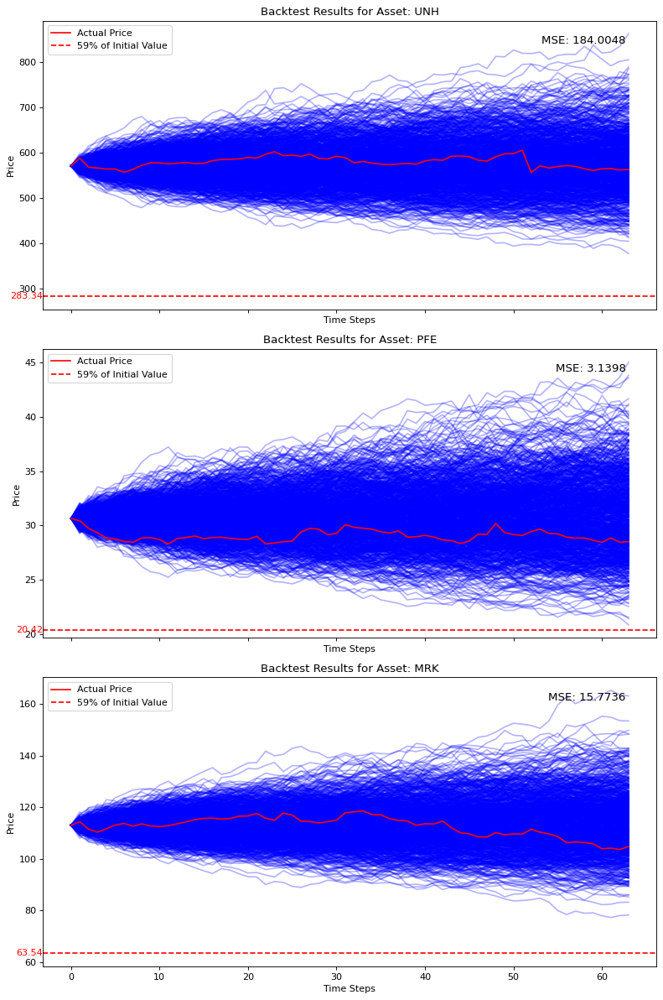

Mean Squared Error (MSE) for each asset: [184.00484626   3.13984035  15.77355387]
Root Mean Squared Error (RMSE) for each asset: [13.5648386   1.77195947  3.97159337]


array([184.00484626,   3.13984035,  15.77355387])

In [10]:
multi_bs.backtest(M=1000, start_date="2024-08-01", end_date="2024-10-30")

### Heston Model

In [98]:
import torch
from heston_model import HestonModel


standard_normal = torch.distributions.Normal(torch.tensor([0]), 1)
s0 = torch.tensor([489.44, 36.65, 111])
r = 0.0419
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
standard_normal = torch.distributions.Normal(torch.tensor([0]).to(device), torch.tensor([1]).to(device))
S0 = torch.tensor(S0)
barrier = 0.59 * S0

r = 0.0419
heston = HestonModel()

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/1950759049.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  S0 = torch.tensor(S0)


In [99]:
params, cov = heston.MLE()
sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)
uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)

/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [100]:
import matplotlib.pyplot as plt
def plot(simulated_data, show_barrier=True, barrier=barrier, asset_labels=["UNH","PFE","MRK"]):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each path for asset i
        ax.plot(simulated_data[i], alpha=0.7)
        if show_barrier:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Simulated Paths for Asset: {asset_labels[i]}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Simulated Price')

    plt.tight_layout()
    plt.show()


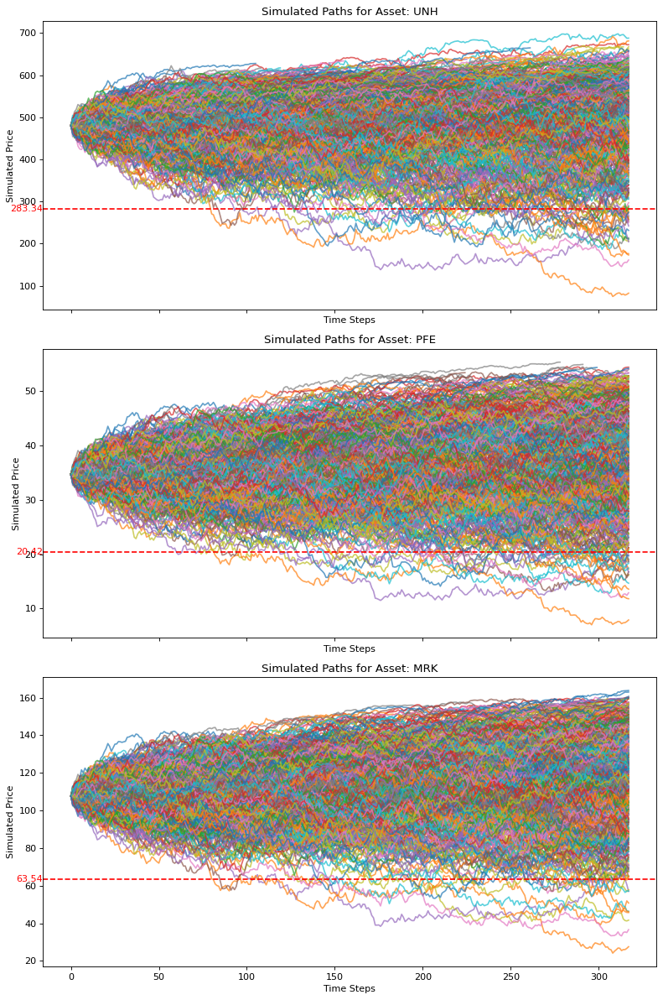

In [103]:
plot(torch.exp(path[1:,:,:,0].permute(1, 2, 0).cpu().detach()))

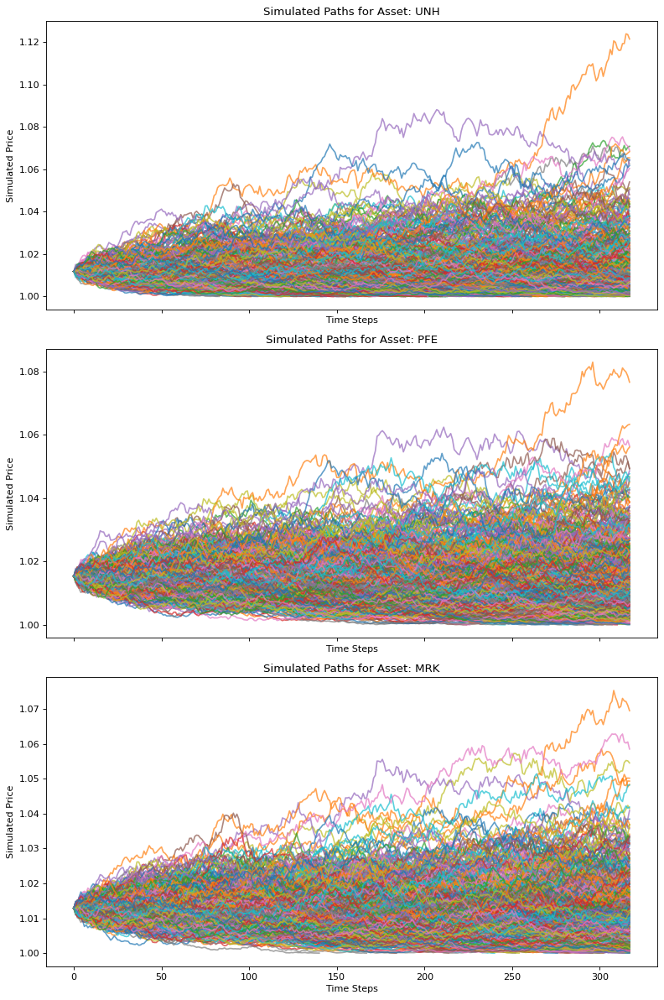

In [15]:
plot(torch.exp(path[1:,:,:,1].permute(1, 2, 0).cpu().detach()), show_barrier=False)

In [16]:
def get_historical_prices(start_date="2023-08-23", end_date="2024-08-01"):
    start_date = pd.to_datetime(start_date).strftime("%Y-%m-%d")
    # Find the index of the start_date in the asset data
    start_index = asset_1.loc[asset_1["Date"] == start_date]["Close"].index[0]

    # Convert the end_date to a pandas datetime format
    end_date = pd.to_datetime(end_date).strftime("%Y-%m-%d")
    # Find the index of the end_date in the asset data
    end_index = asset_1.loc[asset_1["Date"] == end_date]["Close"].index[0]

    # Slice the historical data from start_date onwards
    historical_prices_1 = asset_1["Close"].iloc[start_index:end_index+1].values
    historical_prices_2 = asset_2["Close"].iloc[start_index:end_index+1].values
    historical_prices_3 = asset_3["Close"].iloc[start_index:end_index+1].values
    historical_prices = np.column_stack([historical_prices_1, historical_prices_2, historical_prices_3])
    return (end_index - start_index), historical_prices

In [ ]:
# Plotting function for backtesting
def plot_backtest_results(simulated_data, historical_prices, asset_labels=["UNH","PFE","MRK"], barrier=None, show_barrier=False):
    p, m, M = simulated_data.shape  # number of assets, time steps, number of paths
    mse = np.nanmean((simulated_data[:, :len(historical_prices), :].mean(axis=2) - historical_prices.T) ** 2, axis=1)

    # Create subplots for each asset
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80, sharex=True)
        
    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        # Plot each simulated path for asset i
        for path in range(M):
            ax.plot(simulated_data[i, :, path], color='blue', alpha=0.3)
        # Plot the actual historical price path for asset i
        ax.plot(historical_prices[:, i], color='red', label="Actual Price")
        ax.annotate(f'MSE: {mse[i]:.4f}', xy=(0.95, 0.95), xycoords='axes fraction', horizontalalignment='right', verticalalignment='top', fontsize=12)
        if show_barrier and barrier is not None:
            ax.axhline(y=barrier[i], color='red', linestyle='--', label='59% of Initial Value')
            ax.annotate(f'{barrier[i]:.2f}', xy=(0, barrier[i]),
                    xytext=(-30, 0), textcoords='offset points',
                    color='red', fontsize=10, va='center', ha='right')
        ax.set_title(f'Backtest Results for Asset: {asset_labels[i]}')
        ax.set_xlabel('Time Steps')
        ax.set_ylabel('Price')
        ax.legend(loc='upper left')
    
    plt.tight_layout()
    plt.show()

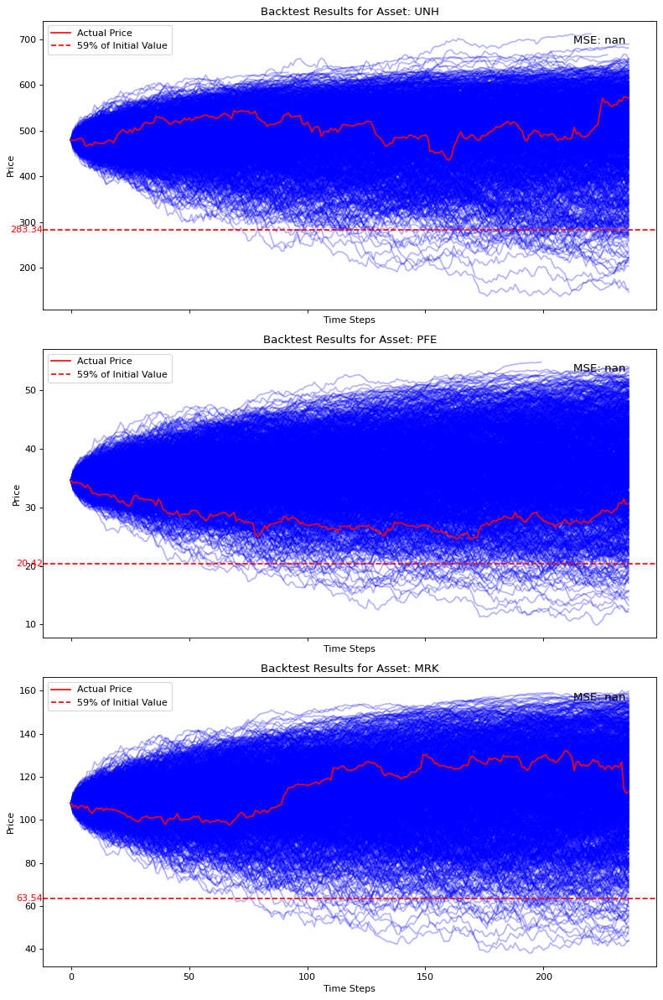

In [18]:
T, s0 = get_historical_prices()
sobol = torch.quasirandom.SobolEngine(3 * 2 * T)
uni = sobol.draw(1_000).reshape(1_000,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, torch.tensor(s0[0]).to(device))
plot_backtest_results(simulated_data=torch.exp(path[1:,:,:,0].permute(1, 2, 0)).cpu().numpy(), historical_prices=s0, barrier=barrier, show_barrier=True)

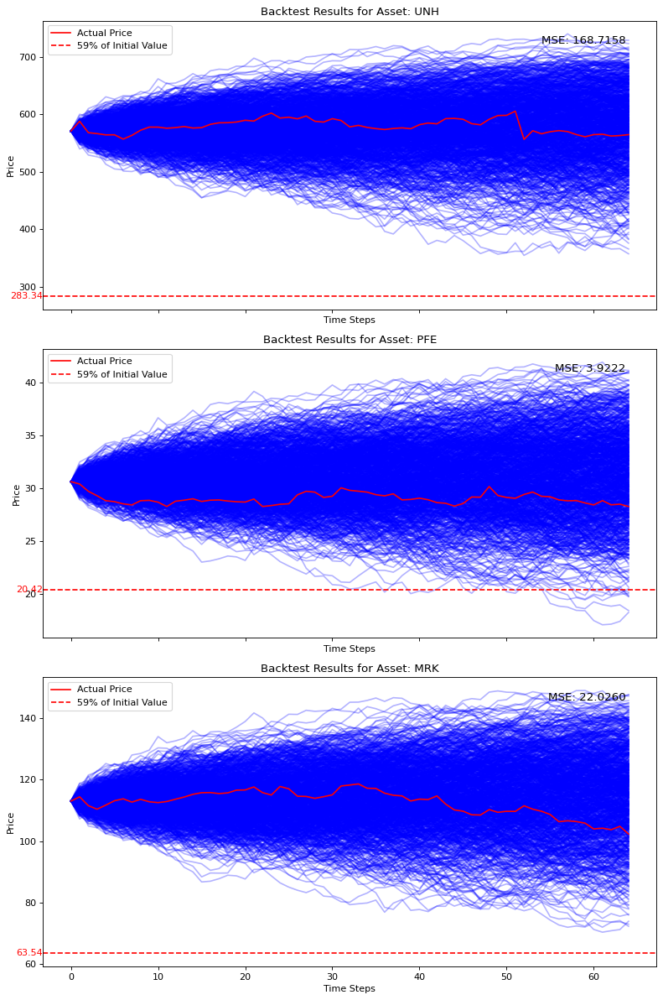

In [19]:
T, s0 = get_historical_prices(start_date="2024-08-01", end_date="2024-10-31")
sobol = torch.quasirandom.SobolEngine(3 * 2 * T)
uni = sobol.draw(1_000).reshape(1_000,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, torch.tensor(s0[0]).to(device))
plot_backtest_results(simulated_data=torch.exp(path[1:,:,:,0].permute(1, 2, 0)).cpu().numpy(), historical_prices=s0, barrier=barrier, show_barrier=True)

### DCC-GARCH Model

In [20]:
from process_data import GARCH
garch = GARCH()
garch.fit()
m = 317
forecast = garch.forecast(m, num_paths=1_000)

/Users/khor/Documents/MH4518 Financial Modelling/Project/process_data.py:80: RuntimeWarning: invalid value encountered in sqrt
  xi = -np.sqrt(nu / np.pi) * (g1 / g2) * (Omega @ iota) / np.sqrt(1 + iota.T @ Omega @ iota)
/Users/khor/Documents/MH4518 Financial Modelling/Project/process_data.py:81: RuntimeWarning: invalid value encountered in log
  loss = (len(shocks) - 1) * (np.log(sp.special.gamma((nu + 3) / 2)) - 0.5 * np.log(np.linalg.det(Omega)) \
/Users/khor/Documents/MH4518 Financial Modelling/Project/process_data.py:73: RuntimeWarning: invalid value encountered in scalar subtract
  num = 2 * (nu - 2) * (np.pi * g2**2 - (nu - 2) * g1**2) * iota_norm
/Users/khor/Documents/MH4518 Financial Modelling/Project/process_data.py:80: RuntimeWarning: invalid value encountered in scalar divide
  xi = -np.sqrt(nu / np.pi) * (g1 / g2) * (Omega @ iota) / np.sqrt(1 + iota.T @ Omega @ iota)
/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/numpy/linalg/_l

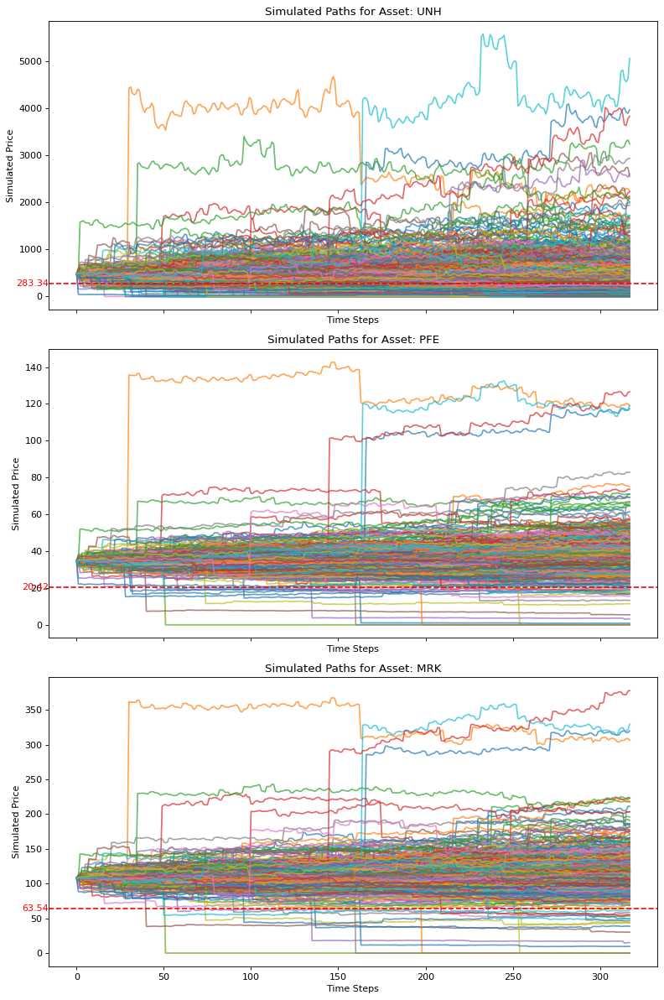

In [21]:
plot(forecast.transpose(1, 2, 0))

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/63513931.py:1: RuntimeWarning: divide by zero encountered in log
  plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)


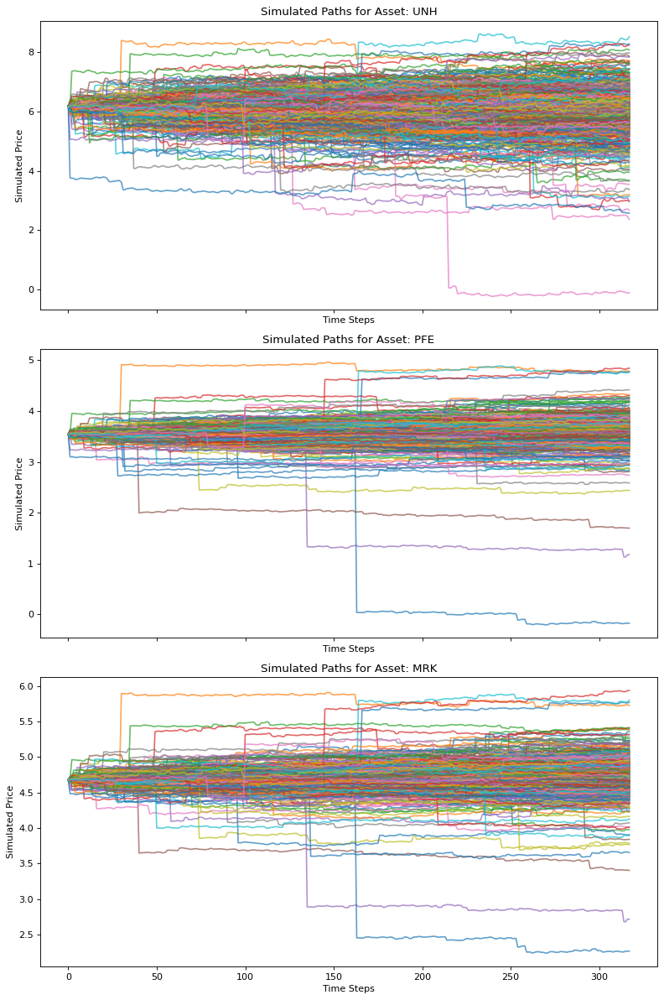

In [22]:
plot(np.log(forecast.transpose(1, 2, 0)), show_barrier=False)

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


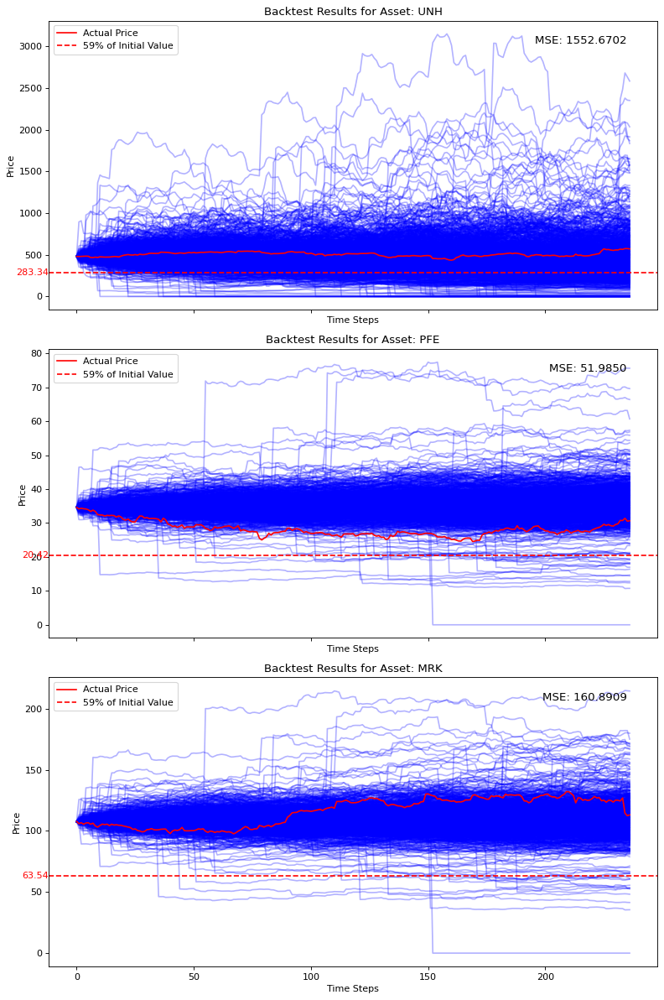

In [23]:
M = 1_000
T, s0 = get_historical_prices()
forecast = garch.forecast(T, M, s0[0])
plot_backtest_results(simulated_data=forecast.transpose(1, 2, 0), historical_prices=s0, barrier=barrier, show_barrier=True)

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


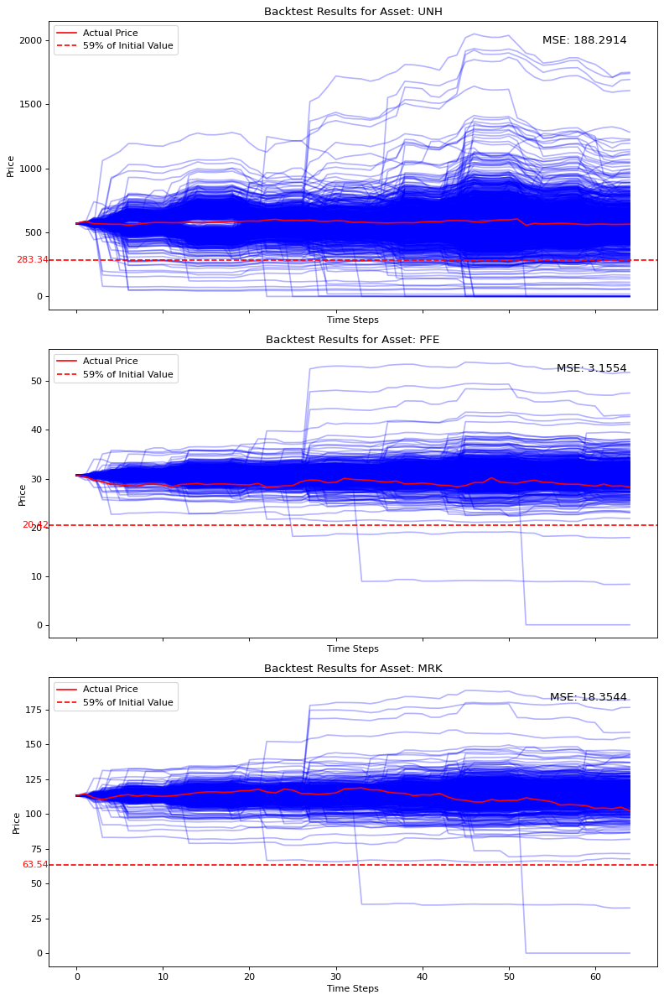

In [24]:
M = 1_000
T, s0 = get_historical_prices(start_date="2024-08-01", end_date="2024-10-31")
forecast = garch.forecast(T, M, s0[0])
plot_backtest_results(simulated_data=forecast.transpose(1, 2, 0), historical_prices=s0, barrier=barrier, show_barrier=True)

# Evaluating Payoff

### Under Black-Scholes Model

Training the callable payoff function

In [25]:
from payoff import CallablePayoff
from tqdm import tqdm

S0 = historical_prices[0,:]
bs_payoff = CallablePayoff(0, r=0.0419, S0=S0)
M = 1_000
epochs = 200
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0) # 317 business days from initial fixing to final fixing
        path = np.log(path) # in asset, timestep, path
        # (path #, asset #, timestep #)
        path = path.transpose(2, 0, 1)
        losses = bs_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


Training Progress: 100%|██████████| 200/200 [00:40<00:00,  4.99it/s, Worst loss=6.23e+3, Best Loss=6.19e+3]


In [26]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 429.2942382035232


In [27]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0)
path = np.log(path) 
path = path.transpose(2, 0, 1)
x = bs_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

Expected Payoff: 1026.647773455752


In [28]:
import matplotlib.pyplot as plt
calling_dates = [129, 189, 254]
payoff_dates = [70, 132, 193, 257, 321]

def plot_backtest_results(payout, calling_dates=calling_dates, payoff_dates=payoff_dates):
    plt.figure(figsize=(30, 6))
    plt.plot(payout)
    plt.xlabel("Days from Initial Fixing Date")
    plt.ylabel("Expected Payoff")

    for calling_date in calling_dates:
        plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    for payoff_date in payoff_dates:
        plt.axvline(x=payoff_date, color='green', linestyle='--', label='Payoff Date')
        
    plt.title("Expected Payoff over Time")
    plt.show()

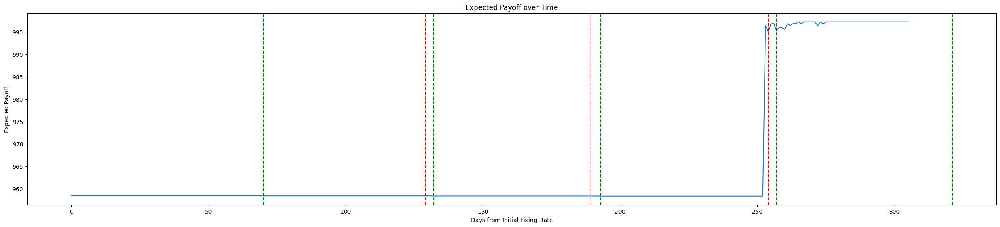

In [29]:
payout_bs = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, True).mean()
    payout_bs.append(expected_payoff.item())

plot_backtest_results(payout_bs)

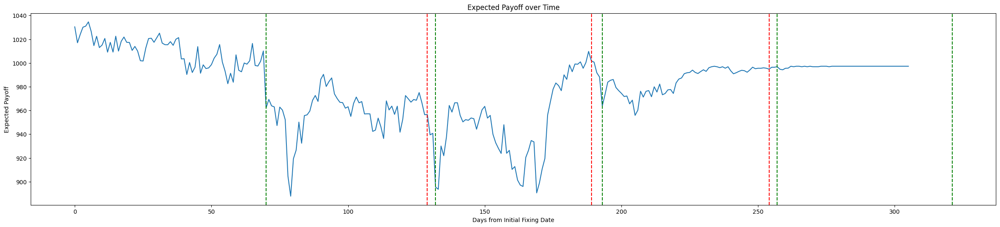

In [30]:
payout_bs_nc = []
bs_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = np.expand_dims(historical_prices[:t,], axis=0).repeat(M, axis=0).transpose(2,1,0)
    bs_payoff.current_date += 1
    path = multi_bs.simulate_multi_GBM_antithetic(m=j, M=M, S0=s0)
    path = np.concatenate([historical_data, path], axis=1)
    path = np.log(path) 
    path = path.transpose(2, 0, 1)
    expected_payoff = bs_payoff.evaluate_payoff(path, False).mean()
    payout_bs_nc.append(expected_payoff.item())

plot_backtest_results(payout_bs_nc)

### Under Heston Model

In [31]:
from payoff import CallablePayoff
from tqdm import tqdm

sobol = torch.quasirandom.SobolEngine(3 * 2 * 317)

params, cov = heston.MLE()
S0 = torch.tensor(S0).to(device=device)
heston_payoff = CallablePayoff(0, 0.0419, S0)
epochs = 500

with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        
        uni = sobol.draw(512).reshape(512,3,-1,2).to(device)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        path = heston.multi_asset_path(u, uni, params, r, cov, S0)
        losses = heston_payoff.minimise_over_path(path[:,:,:,0])
        
        pbar.set_postfix({'Worst loss': max(losses), 
                          'Best Loss': min(losses)})
        pbar.update(1)

/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:251: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_UNH'] = data[f'yz_var_UNH'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:252: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['vol_gain_PFE'] = data[f'yz_var_PFE'].diff()
/Users/khor/Documents/MH4518 Financial Modelling/Project/heston_model.py:253: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataF

In [32]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
mean_return = returns.mean()
print(f"Expected Payoff (Mean): {mean_return}")

# Filter and print returns that are not equal to the mean
non_mean_returns = returns[returns != mean_return]
print(non_mean_returns)

Expected Payoff (Mean): nan
tensor([958.3982, 958.3982, 958.3982, 958.3982, 958.3982, 948.4916, 958.3982,
        350.1087, 958.3982, 958.3982, 958.3982, 958.3982, 656.7985, 958.3982,
        968.8704, 958.3982, 948.4916, 958.3982, 958.3982, 958.3982, 948.4916,
        958.3982, 968.8704, 958.3982, 958.3982, 948.4916, 958.3982, 958.3982,
        958.3982, 495.1482, 968.8704, 386.0328, 968.8704, 958.3982, 958.3982,
        948.4916, 464.2541, 492.8977, 958.3982, 958.3982, 958.3982, 518.0958,
        958.3982, 958.3982, 958.3982, 958.3982, 958.3982, 978.6370, 958.3982,
        958.3982, 958.3982, 958.3982, 303.4136, 958.3982, 968.8704, 958.3982,
        958.3982, 958.3982, 494.8442, 958.3982, 958.3982, 958.3982, 958.3982,
        958.3982, 958.3982, 968.8704, 978.6370, 958.3982, 958.3982, 958.3982,
        958.3982, 968.8704, 958.3982, 958.3982, 958.3982, 621.1972, 958.3982,
        958.3982, 152.3699, 958.3982, 958.3982, 958.3982, 958.3982, 958.3982,
        968.8704, 958.3982, 968.8704

/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


In [33]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
mean_return = returns.mean()
print(f"Expected Payoff (Mean): {mean_return}")

# Filter and print returns that are not equal to the mean
non_mean_returns = returns[returns != mean_return]
print(non_mean_returns)

Expected Payoff (Mean): 1012.4232893066722
tensor([1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,
        1072.4437, 1072.4437, 1072.4437, 1072.4437,  677.3353, 1072.4437,
        1072.4437, 1072.4437, 1072.4437,  574.4877, 1072.4437, 1072.4437,
         616.1308,  836.3577, 1072.4437, 1072.4437, 1072.4437,  624.1058,
        1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,
        1072.4437, 1072.4437,  728.5479, 1072.4437,  803.3934, 1072.4437,
        1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,
        1072.4437, 1072.4437,  824.0804, 1072.4437, 1072.4437, 1072.4437,
         652.3763, 1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,
        1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,
        1072.4437, 1072.4437,  482.5473, 1072.4437, 1072.4437, 1072.4437,
         620.1685, 1072.4437, 1072.4437, 1072.4437, 1072.4437,  520.8607,
        1072.4437, 1072.4437, 1072.4437, 1072.4437, 1072.4437,  464.7

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/3271491084.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)


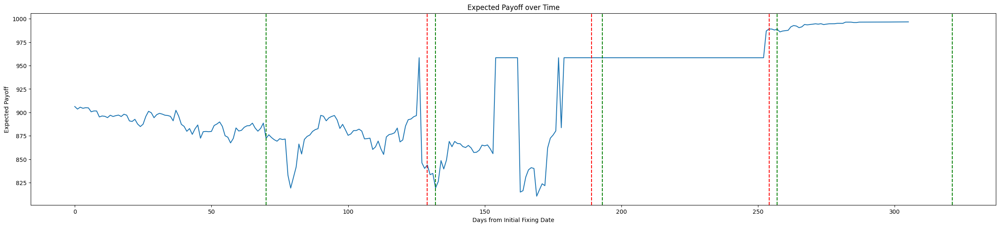

In [34]:
payout_heston = []
heston_payoff.current_date = 0
t = 0
historical_prices = torch.tensor(historical_prices).to(device)

for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, True).nanmean()
    payout_heston.append(expected_payoff.item())

plot_backtest_results(payout_heston)

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/3038897186.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)


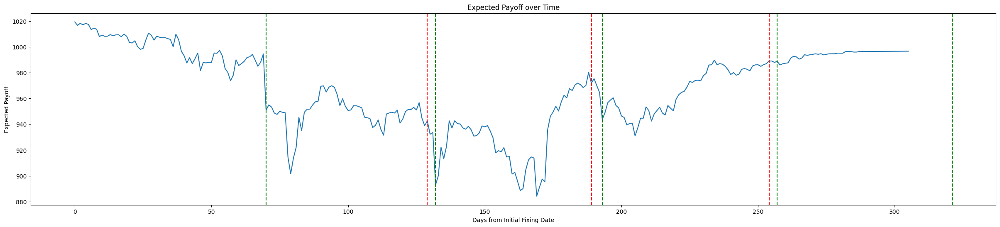

In [35]:
payout_heston_nc = []
heston_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    heston_payoff.current_date += 1
    sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
    uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    path = heston.multi_asset_path(u, uni, params, r, cov, s0)
    path = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
    expected_payoff = heston_payoff.evaluate_payoff(path, False).nanmean()
    payout_heston_nc.append(expected_payoff.item())

plot_backtest_results(payout_heston_nc)

### Under DCC-GARCH Model

In [36]:
m = 317
garch_payoff = CallablePayoff(0, r=0.0419, S0=S0.clone().detach())

epochs = 200
with tqdm(total=epochs, desc="Training Progress") as pbar:
    for epoch in range(epochs):
        path = garch.forecast(steps=m, num_paths=512, s0=S0.cpu()) # 317 business days from initial fixing to final fixing
        path = np.log(np.clip(path, a_min=1e-10, a_max=None)) # in asset, timestep, path
        # (path #, asset #, timestep #)
        losses = garch_payoff.minimise_over_path(path)
        pbar.set_postfix({'Worst loss': max(losses), 
                            'Best Loss': min(losses)})
        pbar.update(1)


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:55: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.S0 = torch.log(torch.tensor(S0)).to(device) # In order of UNH, PFE, MRK
Training Progress:   0%|          | 0/200 [00:00<?, ?it/s]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
Training Progress:   0%|          | 1/200 [00:00<01:27,  2.27it/s, Worst loss=8.51e+4, Best Loss=5.69e+4]/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
Tra

In [37]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1026.647773455752


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/1096211678.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


In [38]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path)
returns = garch_payoff.evaluate_payoff(path, False)
print(f"Expected Payoff: {x.mean()}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 1026.647773455752


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/4121742091.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)
/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().r

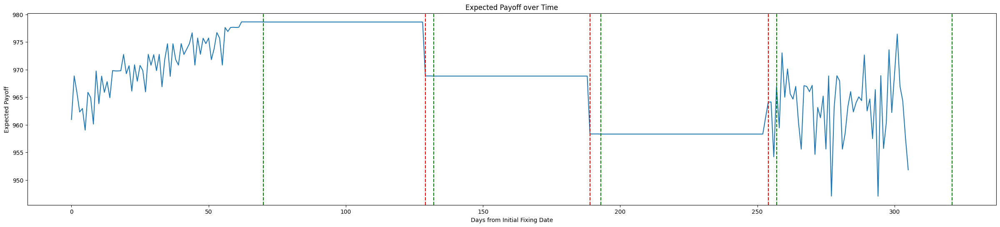

In [39]:
payout_garch = []
garch_payoff.current_date = 0
t = 0
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2).to(device)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
    path = torch.tensor(path).to(device)
    path = torch.cat([historical_data.clone().detach(), path], dim=2)
    paht = torch.log(path)
    expected_payoff = garch_payoff.evaluate_payoff(path, True).mean()
    payout_garch.append(expected_payoff.item())

plot_backtest_results(payout_garch)

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)
/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().r

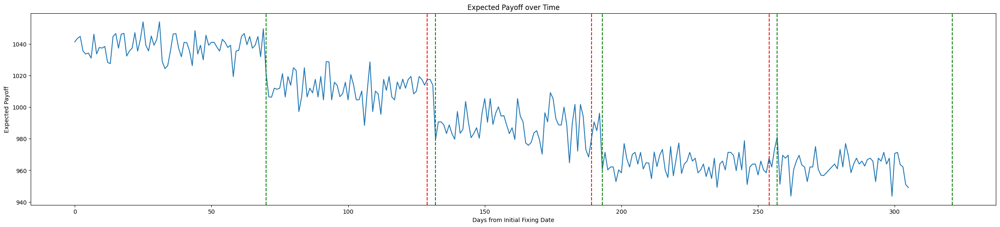

In [40]:
payout_garch_nc = []
garch_payoff.current_date = 0
t = 0
M = 512
for j in range(317, 317 - len(historical_prices), -1):
    s0 = historical_prices[t, :]
    t += 1
    historical_data = historical_prices[:t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2).to(device)
    garch_payoff.current_date += 1
    path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
    path = torch.tensor(path).to(device)
    path = torch.cat([historical_data.clone().detach(), path], dim=2)
    paht = torch.log(path)
    expected_payoff = garch_payoff.evaluate_payoff(path, False).mean()
    payout_garch_nc.append(expected_payoff.item())

plot_backtest_results(payout_garch_nc)

### Payoff Comparison

In [41]:
start_analysis_date="2024-08-01"
start_analysis_date = pd.to_datetime(start_analysis_date).strftime("%Y-%m-%d")
# Find the index of the start_analysis_date in the asset data
start_analysis_index = asset_1.loc[asset_1["Date"] == start_analysis_date].index[0]

end_analysis_date="2024-10-30"
end_analysis_date = pd.to_datetime(end_analysis_date).strftime("%Y-%m-%d")
# Find the index of the end_analysis_date in the asset data
end_analysis_index = asset_1.loc[asset_1["Date"] == end_analysis_date].index[0]

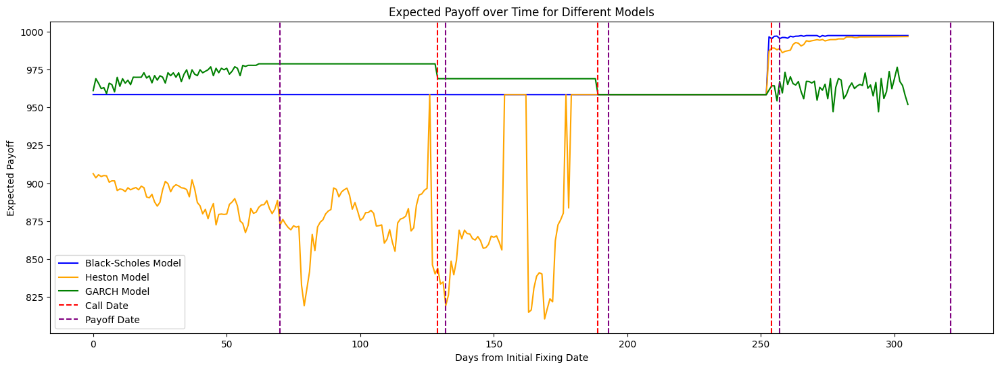

In [42]:
# Plot the expected payoffs for each model
plt.figure(figsize=(18, 6))
plt.plot(payout_bs, label="Black-Scholes Model", color='blue')
plt.plot(payout_heston, label="Heston Model", color='orange')
plt.plot(payout_garch, label="GARCH Model", color='green')

# Mark call dates and payoff dates
for i, calling_date in enumerate(calling_dates):
    if i == 0: plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    else: plt.axvline(x=calling_date, color='red', linestyle='--')
for i, payoff_date in enumerate(payoff_dates):
    if i == 0: plt.axvline(x=payoff_date, color='purple', linestyle='--', label='Payoff Date')
    else: plt.axvline(x=payoff_date, color='purple', linestyle='--')

plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")
plt.title("Expected Payoff over Time for Different Models")
plt.legend()
plt.show()

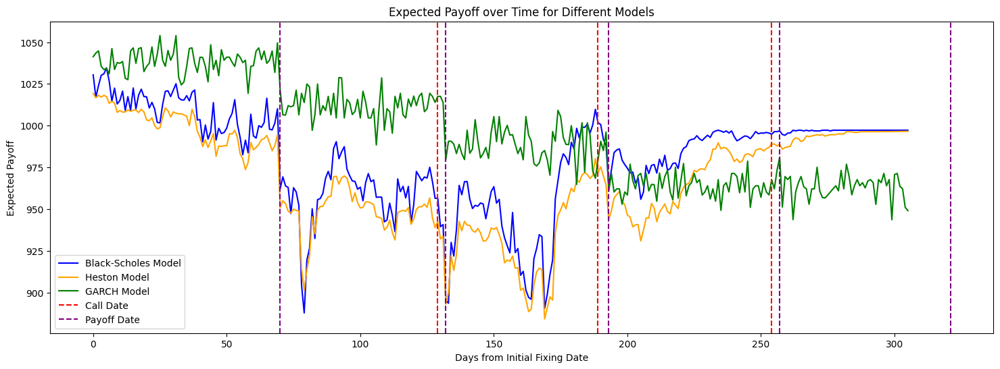

In [43]:
# Plot the expected payoffs for each model
plt.figure(figsize=(18, 6))
plt.plot(payout_bs_nc, label="Black-Scholes Model", color='blue')
plt.plot(payout_heston_nc, label="Heston Model", color='orange')
plt.plot(payout_garch_nc, label="GARCH Model", color='green')

# Mark call dates and payoff dates
for i, calling_date in enumerate(calling_dates):
    if i == 0: plt.axvline(x=calling_date, color='red', linestyle='--', label='Call Date')
    else: plt.axvline(x=calling_date, color='red', linestyle='--')
for i, payoff_date in enumerate(payoff_dates):
    if i == 0: plt.axvline(x=payoff_date, color='purple', linestyle='--', label='Payoff Date')
    else: plt.axvline(x=payoff_date, color='purple', linestyle='--')

plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Expected Payoff")
plt.title("Expected Payoff over Time for Different Models")
plt.legend()
plt.show()

# Choosing the best model :)

### Under Black-Scholes Model

In [44]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
theta_bs = returns.nanmean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 959.7886973816636


In [45]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 6331.015229316334


In [46]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
theta_bs = returns.nanmean()
print(f"Expected Payoff: {theta_bs}")

Expected Payoff: 955.9666045986867


In [47]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var_bs = (1 / (M//2 - 1)) * (((returns[:M//2] + returns[M//2:]) / 2 - theta_bs) ** 2).sum()
print(f"Unbiased Variance under Black-Scholes: {var_bs}")

Unbiased Variance under Black-Scholes: 8395.7794543021


### Under Heston Model

In [48]:
import matplotlib.pyplot as plt

def plot_final_step_histogram(simulated_data, show_barrier=True, inital=None, asset_labels=["UNH", "PFE", "MRK"]):
    if simulated_data is None:
        raise ValueError('No simulated data available. Run the simulation first.')

    p, m, M = simulated_data.shape  # p: number of assets, m: time steps, M: number of paths

    # Ensure barrier is provided and matches the number of assets
    if show_barrier and barrier is None:
        raise ValueError("Barrier values must be provided if show_barrier is True.")
    if barrier is not None and len(barrier) != p:
        raise ValueError("Barrier length must match the number of assets.")

    # Create subplots for each asset's histogram at the final time step
    fig, axes = plt.subplots(p, 1, figsize=(10, 5 * p), dpi=80)

    for i in range(p):
        ax = axes[i] if p > 1 else axes  # Select the appropriate axis if p > 1
        
        # Extract prices at the final time step for asset i
        final_prices = simulated_data[i, -1, :]  # Last time step for asset i
        
        # Plot histogram of final prices
        ax.hist(final_prices, bins=30, alpha=0.7, color='blue', label=f'{asset_labels[i]} Final Prices')
        
        if show_barrier:
            # Plot barrier line
            ax.axvline(x=inital[i], color='black', linestyle='--', label='Initial Value')
            ax.axvline(x=0.59 * inital[i], color='red', linestyle='--', label='Barrier')
            ax.annotate(f'{inital[i]:.2f}', xy=(inital[i], 0),
                        xytext=(10, 10), textcoords='offset points',
                        color='red', fontsize=10, va='center', ha='right')
            ax.annotate(f'{0.59 * inital[i]:.2f}', xy=(0.59 * inital[i], 0),
                        xytext=(10, 10), textcoords='offset points',
                        color='red', fontsize=10, va='center', ha='right')
        
        # Titles and labels
        ax.set_title(f'Histogram of Final Prices for Asset: {asset_labels[i]}')
        ax.set_xlabel('Price')
        ax.set_ylabel('Frequency')
        ax.legend()

    plt.tight_layout()
    plt.show()


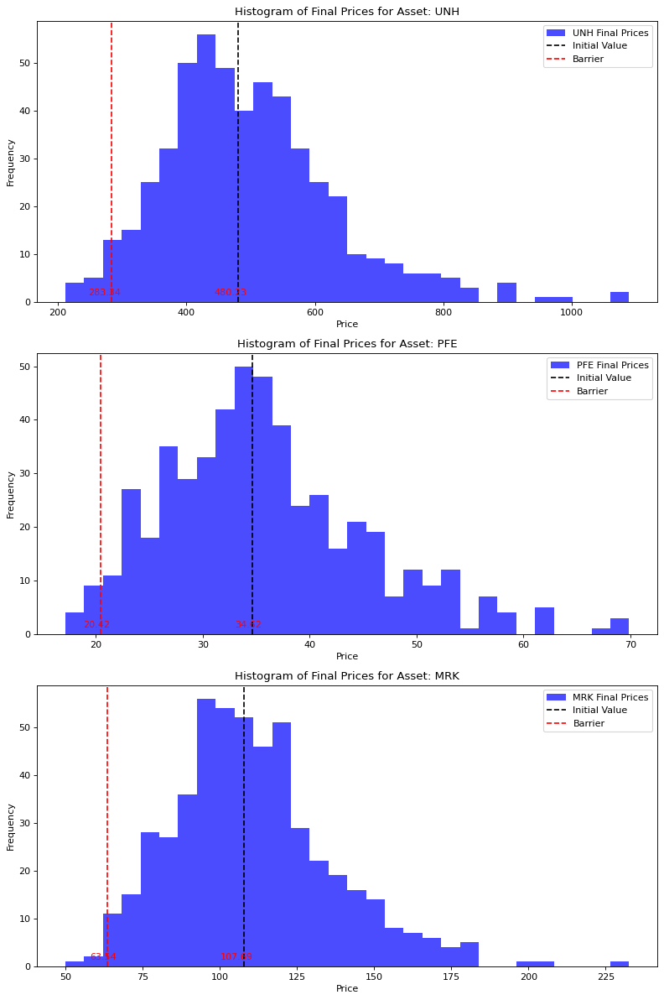

In [49]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())

plot_final_step_histogram(path, True, S0.cpu())

In [108]:
M = 10_000
S0 = historical_prices[0, :]
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
path = path[1:,:,:,:]
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
theta_heston = returns.nanmean()
print(f"Expected Payoff: {theta_heston}")

returns = returns[~returns.isnan()]
var_heston = torch.var(returns-theta_heston)
print(f"Unbiased Variance under Heston: {var_heston}")

Expected Payoff: 932.7545702809068
Unbiased Variance under Heston: 25752.198003398826


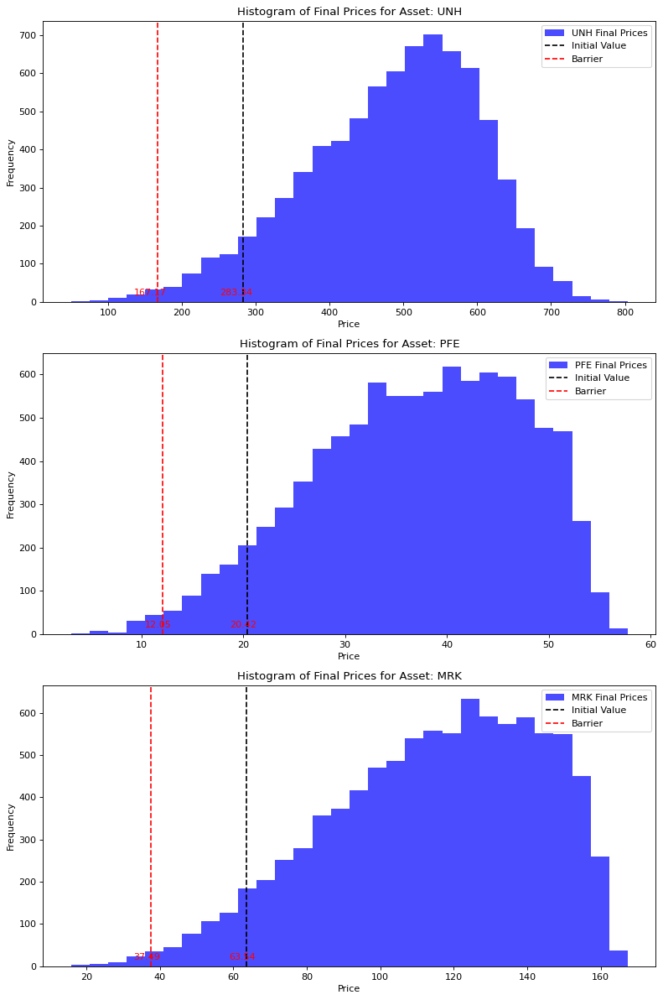

In [109]:
plot_final_step_histogram(torch.exp(path[:,:,:,0].permute(1, 2, 0).cpu().detach()), True, barrier)

In [52]:
S0 = S0.clone().detach()
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0)
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
theta_heston = returns.nanmean()
print(f"Expected Payoff: {theta_heston}")

returns = returns[~returns.isnan()]
var_heston = torch.var(returns-theta_heston)
print(f"Unbiased Variance under Heston: {var_heston}")

Expected Payoff: 997.2439271253169
Unbiased Variance under Heston: 0.0


### Under DCC-GARCH Model

In [53]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = torch.tensor(np.log(path))
returns = garch_payoff.evaluate_payoff(path, True)
theta_garch = returns.nanmean()
print(f"Expected Payoff: {theta_garch}")

returns = returns[~returns.isnan()]
var_garch = torch.var(returns-theta_garch)
print(f"Unbiased Variance under GARCH: {var_garch}")
print(f"Unbiased sd under GARCH: {torch.sqrt(var_garch)}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/3504955350.py:2: RuntimeWarning: divide by zero encountered in log
  path = torch.tensor(np.log(path))
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


Expected Payoff: 768.2776661748569
Unbiased Variance under GARCH: 88188.54119055561
Unbiased sd under GARCH: 296.96555556251906


In [140]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = torch.tensor(np.log(path))
returns = garch_payoff.evaluate_payoff(path, False)
theta_garch = returns.nanmean()
print(f"Expected Payoff: {theta_garch}")

returns = returns[~returns.isnan()]
var_garch = torch.var((returns-theta_garch)**2)
print(f"Unbiased Variance under GARCH: {var_garch}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


Expected Payoff: 770.4737957233224
Unbiased Variance under GARCH: 12028977675.391697


/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/4165699245.py:2: RuntimeWarning: divide by zero encountered in log
  path = torch.tensor(np.log(path))
/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


In [147]:
import numpy as np
import torch

def clip_out_of_range(simulated_data, initial_levels, lower_clip=0.5, upper_clip=1.5):
    """
    Masks values in simulated_data that fall outside the specified range of initial levels for each asset.

    Parameters:
        simulated_data (torch.Tensor or np.ndarray): Simulated asset prices with shape (num_paths, num_assets, num_steps).
        initial_levels (list or array): Initial levels for each asset with shape (num_assets,).
        lower_clip (float): Lower clip factor as a fraction of initial levels (e.g., 0.5 for 50%).
        upper_clip (float): Upper clip factor as a fraction of initial levels (e.g., 1.5 for 150%).

    Returns:
        masked_data: Simulated data with values outside the specified range set to NaN.
    """
    # Ensure data is a torch tensor for compatibility
    if isinstance(simulated_data, np.ndarray):
        simulated_data = torch.tensor(simulated_data, dtype=torch.float32)
    
    # Convert initial levels to a tensor and calculate lower and upper thresholds for each asset
    initial_levels_tensor = torch.tensor(initial_levels, dtype=simulated_data.dtype, device=simulated_data.device)
    lower_thresholds = lower_clip * initial_levels_tensor  # Shape (num_assets,)
    upper_thresholds = upper_clip * initial_levels_tensor  # Shape (num_assets,)
    
    # Expand thresholds to match simulated_data dimensions for broadcasting
    lower_thresholds_expanded = lower_thresholds.unsqueeze(0).unsqueeze(-1)  # Shape (1, num_assets, 1)
    upper_thresholds_expanded = upper_thresholds.unsqueeze(0).unsqueeze(-1)  # Shape (1, num_assets, 1)
    
    clipped_data = torch.clamp(simulated_data, min=lower_thresholds_expanded, max=upper_thresholds_expanded)
    
    return clipped_data

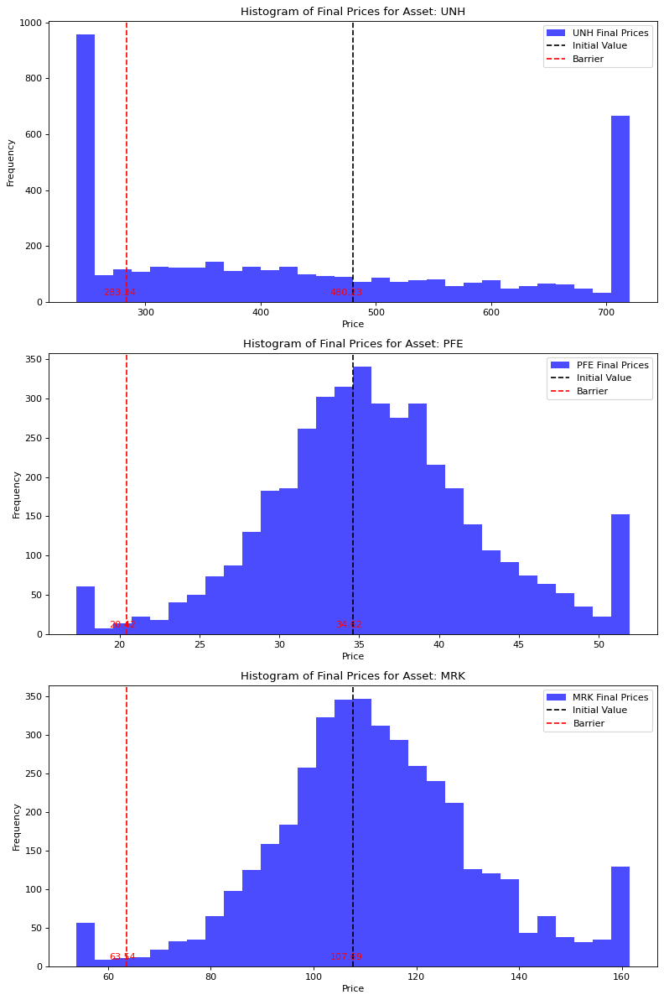

In [ ]:
path = clip_out_of_range(path, S0)
plot_final_step_histogram(path.permute((1,2,0)), True, S0.cpu())

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)


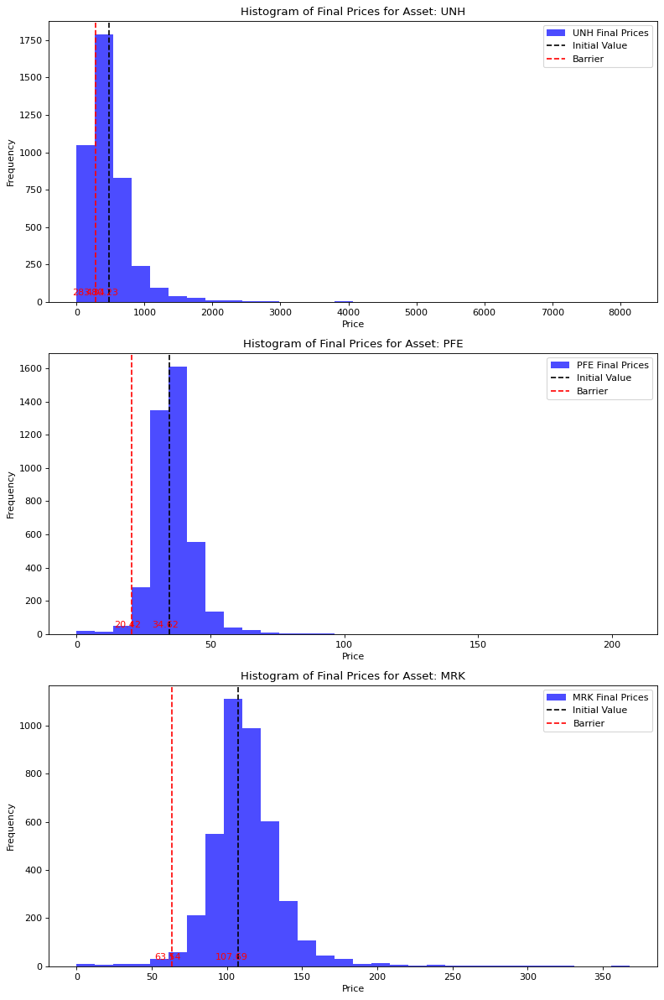

In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
plot_final_step_histogram(path.transpose((1,2,0)), True, S0.cpu())

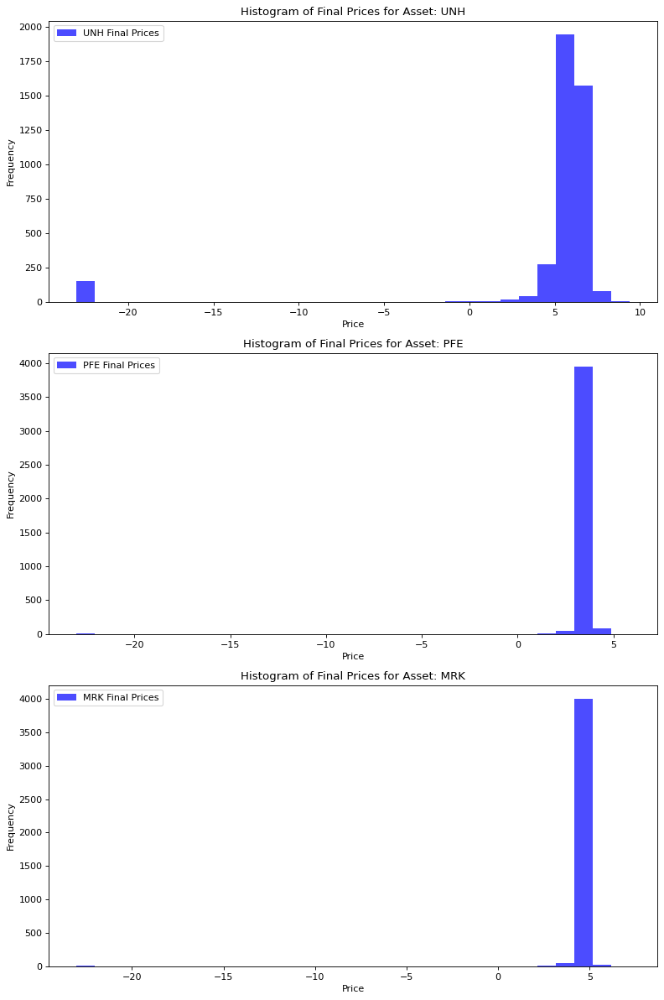

In [145]:
plot_final_step_histogram(np.log(np.clip(path, a_min=1e-10, a_max=None)).transpose((1,2,0)), False, S0.cpu())

# Portfolio Optimization

### Under Black-Scholes Model

In [ ]:
delta = multi_bs.calculate_delta(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.cpu().numpy())
gamma = multi_bs.calculate_gamma(pay_off=bs_payoff, m=317, M=M, h=0.01, S0=S0.cpu().numpy())
print(f"Delta: {delta}, \nGamma: \n{gamma}")

Delta: [0.34412725 5.49555681 0.65076645], 
Gamma: 
[[-0.003312    0.0050572   0.04168425]
 [-0.21793018 -2.57891939 -0.6757045 ]
 [-0.06153127  0.76599313  0.08315595]]


### Under Heston Model

In [ ]:
delta = torch.empty(3)
for i in range(3):
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    up_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
    down_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
    
    delta[i] = (up_payoff - down_payoff) / 0.02 / s0[i]
print('Payoff delta:', delta.tolist())

# Find gamma
gamma = torch.empty((3,3))
for i in range(3):
    for j in range(3):
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 1.01
        
        up1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up1_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 1.01
        s0_temp[j] *= 0.99
        
        down1_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down1_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
            
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 1.01
        
        down2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        down2_payoff = heston_payoff.evaluate_payoff(down_paths[:,:,:,0]).nanmean()
        
        uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
        av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
        uni = torch.cat((uni, av), dim=0)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
        
        s0_temp = s0
        s0_temp[i] *= 0.99
        s0_temp[j] *= 0.99
        
        up2_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)
        up2_payoff = heston_payoff.evaluate_payoff(up_paths[:,:,:,0]).nanmean()
        
        gamma[i,j] = (up1_payoff - down1_payoff - down2_payoff + up2_payoff) / (4 * 0.01**2 * s0[i] * s0[j])
print('Payoff gamma:', gamma.tolist())

put_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Put delta:', put_delta.tolist())

put_gamma = torch.empty((3,3))
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = torch.clamp(s0_temp[i]-up_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    
    mid_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    mid_put = torch.clamp(s0_temp[i]-mid_paths[:,-1], 0).nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = torch.clamp(s0_temp[i]-down_paths[:,-1], 0).nanmean()
    
    put_delta[i] = (up_put - 2 * mid_put + down_put) / (0.04 * s0[i]**2)
print('Put gamma:', put_delta.tolist())

stock_delta = torch.empty(3)
for i in range(3):
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 1.01
    
    up_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    up_put = up_paths[:,-1].nanmean()
    
    uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
    av = torch.stack((1-uni[:,:,:,0], uni[:,:,:,1]), dim=-1)
    uni = torch.cat((uni, av), dim=0)
    u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
    
    s0_temp = s0
    s0_temp[i] *= 0.99
    
    down_paths = heston.multi_asset_path(u, uni, params, r, cov, s0, verbose=False)[:,i,:,0]
    down_put = down_paths[:,-1].nanmean()
    
    stock_delta[i] = (up_put - down_put) / 0.02 / s0[i]
print('Stock delta:', stock_delta.tolist())

/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


Payoff delta: [-2.5360898759526716e-05, 0.003963201521257458, 0.0020819110764713467]
Payoff gamma: [[5.751064229217978e-05, 0.0012680196736613671, 0.00034424023640117224], [0.0012687807518207204, 0.027980226038145355, 0.007592995310676], [0.00034451575255809846, 0.007597552702816723, 0.0020629857311868878]]
Put delta: [0.5042194019936381, 0.4867262354895827, 0.5000769225028372]
Put gamma: [-0.000417025132896001, -0.008875898693925842, -0.0024751671793642465]
Stock delta: [0.0008310514596792266, 0.018323680150391833, 0.004973119439566938]


### Under DCC-GARCH 

## Portfolio Value over analysis period

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/2943868329.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  historical_prices = torch.tensor(historical_prices).to(device)


delta = [0. 0. 0.]
s0 = [574.12414551  30.54000092 112.37813568]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [570.74615479  30.64999962 113.06355286]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [587.74591064  30.43000031 114.43437958]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [567.94610596  29.73999977 111.563591  ]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [566.34173584  29.31999969 110.41130066]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [564.07983398  28.85000038 111.74239349]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [564.23919678  28.76000023 113.16288757]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [556.78564453  28.54999924 113.78870392]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [563.2925415   28.45000076 112.72581482]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [572.2109375   28.85000038 113.62976837]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [577.62176514  28.87999916 112.82514954]
counter balance: 0.0
delta = [0. 0. 0.]
s0 = [577.56195068  28.70999908 112

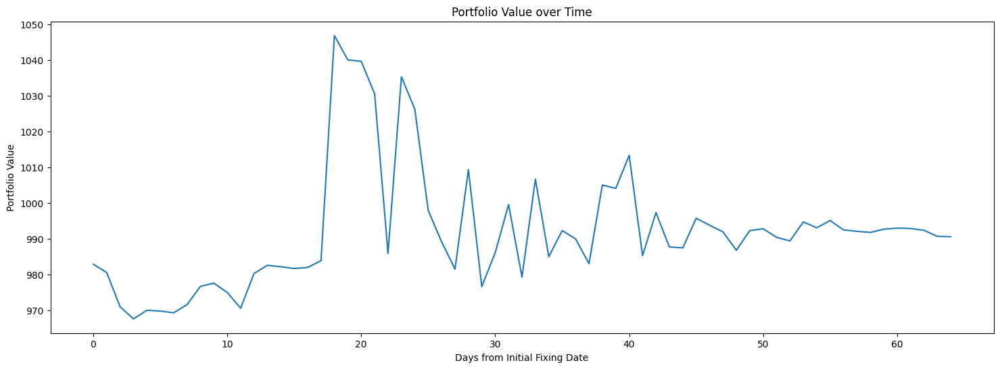

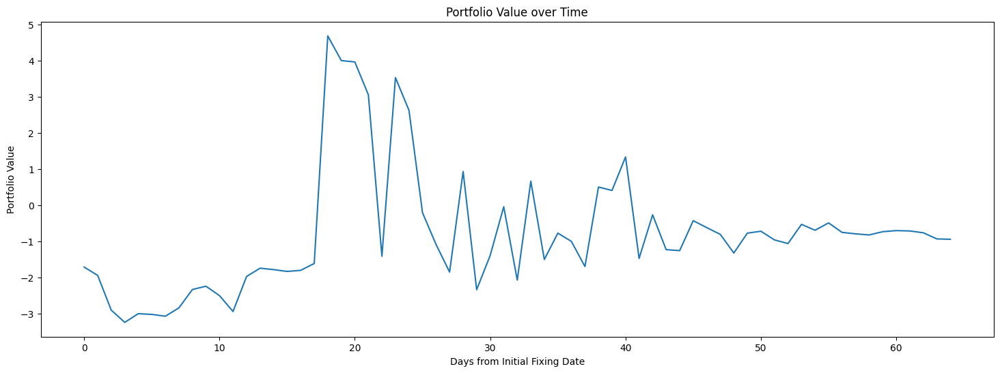

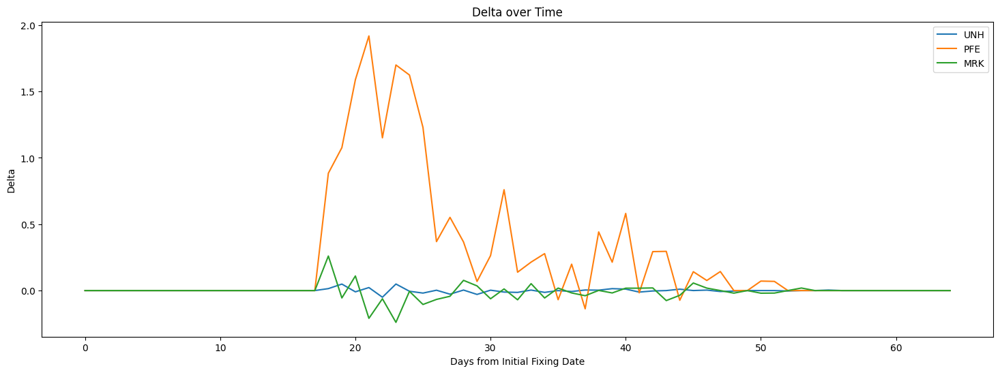

In [ ]:
portfolio_values = []
delta_UNH = []
delta_PFE = []
delta_MRK = []

bs_payoff.current_date = 0
t = 0
historical_prices = torch.tensor(historical_prices).to(device)

start_date="2023-08-23"
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date]["Close"].index[0]

start_analysis_date="2024-07-31"
# Find the index of the start_analysis_date in the asset data
start_analysis_index = asset_1.loc[asset_1["Date"] == start_analysis_date]["Close"].index[0]

end_analysis_date="2024-10-31"
# Find the index of the end_analysis_date in the asset data
end_analysis_index = asset_1.loc[asset_1["Date"] == end_analysis_date]["Close"].index[0]

current_date = start_analysis_index - start_index
M = 10_000
bs_payoff.current_date = current_date
end_analysis_date = 317 - (end_analysis_index - start_index)
for j in range(317 - current_date, end_analysis_date, -1):
    # j is the number of time steps left to the final fixing date
    # t tracks the number of time steps from the initial analysis date
    s0 = historical_prices[current_date + t, :].clone().detach().numpy()
    historical_data = historical_prices[:current_date + t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    note_price = df.iloc[t, 1]
    t += 1
    bs_payoff.current_date += 1
    
    delta = multi_bs.calculate_delta(pay_off=bs_payoff, m=j, M=M, h=0.01, S0=s0)
    
    # print(f"delta = {delta}")
    # print(f"s0 = {s0}")
    # print(f"counter balance: {(delta * s0).sum()}")
    # print(f"Delta at time step {j}: {delta}, Note Price: {note_price}")
    portfolio_value = (delta * s0).sum() + note_price * 1000 / 100
    portfolio_values.append(portfolio_value)
    delta_UNH.append(delta[0])
    delta_PFE.append(delta[1])
    delta_MRK.append(delta[2])
    

plt.figure(figsize=(18, 6))
plt.plot(portfolio_values)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Portfolio Value")
plt.title("Portfolio Value over Time")
plt.show()    

portfolio_values_np = np.array(portfolio_values).flatten()
portfolio_pct_change = ((portfolio_values_np / 1000) - 1) * 100
plt.figure(figsize=(18, 6))
plt.plot(portfolio_pct_change)
# plt.ylim(-10, 10)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Portfolio Value")
plt.title("Portfolio Value over Time")
plt.show()    

plt.figure(figsize=(18, 6))
plt.plot(delta_UNH, label="UNH")
plt.plot(delta_PFE, label="PFE")
plt.plot(delta_MRK, label="MRK")
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Delta")
plt.title("Delta over Time")
plt.legend()
plt.show()

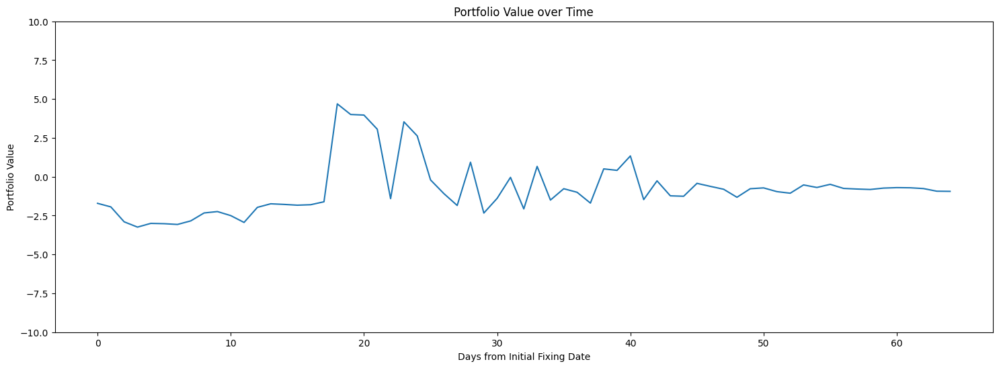

In [128]:


portfolio_values_np = np.array(portfolio_values).flatten()
portfolio_pct_change = ((portfolio_values_np / 1000) - 1) * 100
plt.figure(figsize=(18, 6))
plt.plot(portfolio_pct_change)
plt.ylim(-10, 10)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Portfolio Value")
plt.title("Portfolio Value over Time")
plt.show()    

/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/602891034.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  historical_prices = torch.tensor(historical_prices).to(device)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/602891034.py:45: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  up_paths = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_971/602891034.py:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  down_paths = torc

delta = tensor([0., 0., 0.])
s0 = tensor([574.1241,  30.5400, 112.3781])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([570.7462,  30.6500, 113.0636])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([587.7459,  30.4300, 114.4344])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([567.9461,  29.7400, 111.5636])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([566.3417,  29.3200, 110.4113])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([564.0798,  28.8500, 111.7424])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([564.2392,  28.7600, 113.1629])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([556.7856,  28.5500, 113.7887])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([563.2925,  28.4500, 112.7258])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([572.2109,  28.8500, 113.6298])
counter balance: 0.0
delta = tensor([0., 0., 0.])
s0 = tensor([577.6218,  28.8800

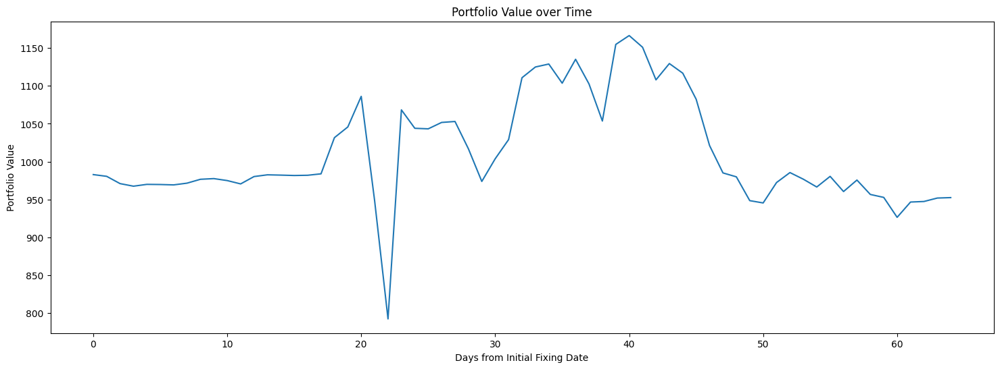

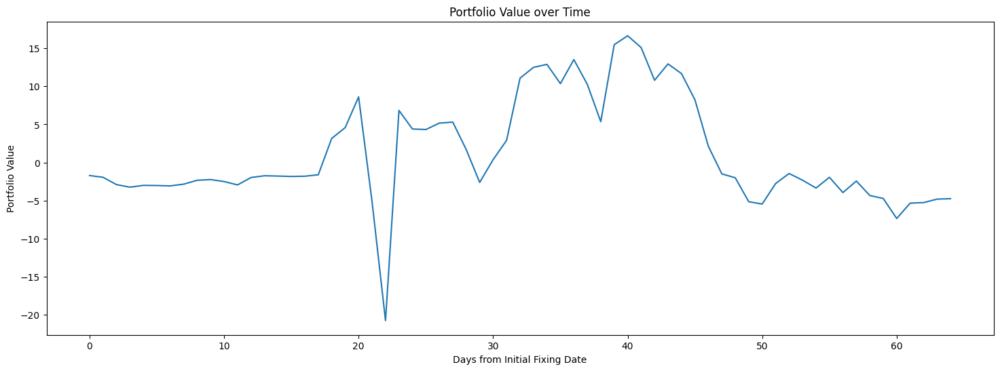

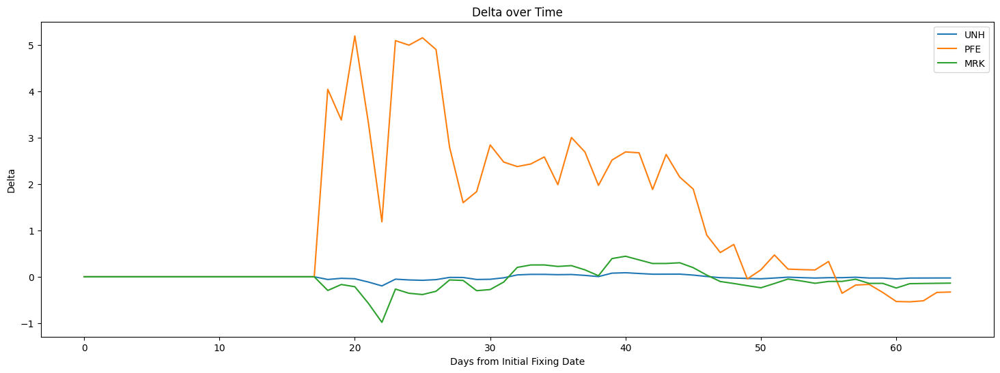

In [ ]:
portfolio_values = []
delta_UNH = []
delta_PFE = []
delta_MRK = []

heston_payoff.current_date = 0
t = 0
historical_prices = torch.tensor(historical_prices).to(device)

start_date="2023-08-23"
# Find the index of the start_date in the asset data
start_index = asset_1.loc[asset_1["Date"] == start_date]["Close"].index[0]

start_analysis_date="2024-07-31"
# Find the index of the start_analysis_date in the asset data
start_analysis_index = asset_1.loc[asset_1["Date"] == start_analysis_date]["Close"].index[0]

end_analysis_date="2024-10-31"
# Find the index of the end_analysis_date in the asset data
end_analysis_index = asset_1.loc[asset_1["Date"] == end_analysis_date]["Close"].index[0]

current_date = start_analysis_index - start_index
M = 4096
heston_payoff.current_date = current_date
end_analysis_date = 317 - (end_analysis_index - start_index)
for j in range(317 - current_date, end_analysis_date, -1):
    # j is the number of time steps left to the final fixing date
    # t tracks the number of time steps from the initial analysis date
    s0 = historical_prices[current_date + t, :].clone().detach()
    historical_data = historical_prices[:current_date + t].unsqueeze(0).repeat(M, 1, 1).transpose(1, 2)
    note_price = df.iloc[t, 1]
    t += 1
    heston_payoff.current_date += 1
    
    # calculate delta
    delta = torch.empty(3)
    for i in range(3):
        sobol = torch.quasirandom.SobolEngine(3 * 2 * j)
        uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)

        s0_temp = s0.clone().detach()
        s0_temp[i] += 0.01 * s0[i]
        path = heston.multi_asset_path(u, uni, params, r, cov, s0_temp)
        up_paths = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
        up_payoff = heston_payoff.evaluate_payoff(up_paths)
        
        uni = sobol.draw(M).reshape(M, 3, -1, 2).to(device)
        u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)

        s0_temp = s0.clone().detach()
        s0_temp[i] -= 0.01 * s0[i]
        path = heston.multi_asset_path(u, uni, params, r, cov, s0_temp)
        down_paths = torch.cat([torch.log(torch.tensor(historical_data)), path[:,:,:,0]], dim=2)
        down_payoff = heston_payoff.evaluate_payoff(down_paths)   

        delta_i_list = (up_payoff - down_payoff) / 0.02 / s0[i]
        delta_i_list = delta_i_list[~delta_i_list.isnan()]

        delta[i] = delta_i_list.mean()
    
    # print(f"delta = {delta}")
    # print(f"s0 = {s0}")
    # print(f"counter balance: {(delta * s0).sum()}")
    # print(f"Delta at time step {j}: {delta}, Note Price: {note_price}")
    portfolio_value = (delta * s0).sum() + note_price * 1000 / 100
    portfolio_values.append(portfolio_value)
    delta_UNH.append(delta[0])
    delta_PFE.append(delta[1])
    delta_MRK.append(delta[2])
    

plt.figure(figsize=(18, 6))
plt.plot(portfolio_values)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Portfolio Value")
plt.title("Portfolio Value over Time")
plt.show()    

portfolio_values_np = torch.stack(portfolio_values).numpy().flatten()
portfolio_pct_change = ((portfolio_values_np / 1000) - 1) * 100
plt.figure(figsize=(18, 6))
plt.plot(portfolio_pct_change)
# plt.ylim(-10, 10)
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Portfolio Value")
plt.title("Portfolio Value over Time")
plt.show()    

plt.figure(figsize=(18, 6))
plt.plot(delta_UNH, label="UNH")
plt.plot(delta_PFE, label="PFE")
plt.plot(delta_MRK, label="MRK")
plt.xlabel("Days from Initial Fixing Date")
plt.ylabel("Delta")
plt.title("Delta over Time")
plt.legend()
plt.show()

# Risk Analysis

### Under Black-Scholes Model

In [ ]:
from helper import calculate_var_cvar
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 572.6428280059762, Conditional Value at Risk: 523.9320532205494


In [ ]:
path = multi_bs.simulate_multi_GBM_antithetic(m=317, M=M,S0=S0.cpu())
path = np.log(path) 
path = path.transpose(2, 0, 1)
returns = bs_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 571.6666468326425, Conditional Value at Risk: 523.5522426478727


### Under Heston Model

In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0.to(device))
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253165


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


In [ ]:
uni = sobol.draw(M).reshape(M,3,-1,2).to(device)
u = standard_normal.icdf(uni * (1 - 2 * 1e-6) + 1e-6)
path = heston.multi_asset_path(u, uni, params, r, cov, S0.to(device))
returns = heston_payoff.evaluate_payoff(path[:,:,:,0], False)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

Value at Risk: 997.2439271253164, Conditional Value at Risk: 997.2439271253165


/Users/khor/Documents/MH4518 Financial Modelling/Project/payoff.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  path = torch.tensor(path).to(device)


### Under DCC-GARCH Model

In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0.cpu())
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, True)
var, cvar = calculate_var_cvar(returns.cpu(), confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_3613/1601313894.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


Value at Risk: 155.59046185788094, Conditional Value at Risk: 66.24033834709918


In [ ]:
path = garch.forecast(steps=m, num_paths=M, s0=S0)
path = np.log(path) 
returns = garch_payoff.evaluate_payoff(path, False)
var, cvar = calculate_var_cvar(returns, confidence_level=0.95)
print(f"Value at Risk: {var.item()}, Conditional Value at Risk: {cvar}")

/Users/khor/Documents/MH4518 Financial Modelling/Project/.venv/lib/python3.12/site-packages/scipy/stats/_qmc.py:958: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  sample = self._random(n, workers=workers)
/var/folders/77/0ssjf9fd1dv4br4d_m3pd8qc0000gn/T/ipykernel_3613/3197940339.py:2: RuntimeWarning: divide by zero encountered in log
  path = np.log(path)


Value at Risk: 148.9520283617162, Conditional Value at Risk: 65.13152227898706
